# BetaVAE Beta Sweep Analysis
Train: 2013–2023 | Test: 2024–2026 | K=6 latent factors

Run `python scripts/run_betavae_5k_8b.py` before opening this notebook.

In [1]:
from pathlib import Path
import re
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import seaborn as sns

SWEEP   = next(p / "beta_sweep_k6" for p in [Path(".").resolve(), Path(".").resolve().parent] if (p / "beta_sweep_k6").exists())  # run from results/ or repo root
FACTORS = SWEEP / "factors"
ERRORS  = SWEEP / "errors"

assert ERRORS.exists(), (
    "No beta sweep data found. Run first:\n"
    "  python scripts/run_beta_sweep.py"
)

def _parse_beta(name):
    m = re.search(r"BetaVAE_b([\d.]+)", name)
    return float(m.group(1)) if m else None

# Auto-discover beta variants from saved CSVs
BETA_ARCHS = sorted(
    {f.stem.replace("_train_recon_error", "").replace("_test_recon_error", "")
     for f in ERRORS.glob("BetaVAE_b*_recon_error.csv")},
    key=_parse_beta,
)
BETAS = [_parse_beta(a) for a in BETA_ARCHS]
assert BETA_ARCHS, "No BetaVAE_b* CSV files found in beta_sweep/errors/"
print(f"Found {len(BETA_ARCHS)} beta variants: {BETAS}")

# Load recon errors
train_errors = {
    name: pd.read_csv(ERRORS / f"{name}_train_recon_error.csv", index_col=0, parse_dates=True)
    for name in BETA_ARCHS
}
test_errors = {
    name: pd.read_csv(ERRORS / f"{name}_test_recon_error.csv", index_col=0, parse_dates=True)
    for name in BETA_ARCHS
}

# Per-commodity MSE tables
def mse_table(errors_dict):
    rows = {}
    for name, err in errors_dict.items():
        per_com = (err ** 2).mean()
        per_com["ALL"] = float((err.to_numpy() ** 2).mean())
        rows[name] = per_com
    return pd.DataFrame(rows).T

train_mse_tbl = mse_table(train_errors)
test_mse_tbl  = mse_table(test_errors)

train_mses = [train_mse_tbl.loc[a, "ALL"] for a in BETA_ARCHS]
test_mses  = [test_mse_tbl.loc[a, "ALL"]  for a in BETA_ARCHS]

/opt/anaconda3/lib/python3.12/site-packages/pandas/core/computation/expressions.py:23: UserWarning: Pandas requires version '2.10.2' or newer of 'numexpr' (version '2.8.7' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/opt/anaconda3/lib/python3.12/site-packages/pandas/core/arrays/masked.py:56: UserWarning: Pandas requires version '1.4.2' or newer of 'bottleneck' (version '1.3.7' currently installed).
  from pandas.core import (


Found 8 beta variants: [0.3, 0.5, 0.8, 1.0, 2.0, 3.0, 4.0, 5.0]


## Summary Table

In [2]:
summary = pd.DataFrame({
    "beta":           BETAS,
    "train_recon_mse": train_mses,
    "test_recon_mse":  test_mses,
    "generalisation_gap": [t - r for r, t in zip(train_mses, test_mses)],
}, index=BETA_ARCHS)
display(summary.round(5))

,beta,train_recon_mse,test_recon_mse,generalisation_gap
BetaVAE_b0.3,0.3,0.64630,0.74859,0.10229
BetaVAE_b0.5,0.5,0.64977,0.75167,0.10189
BetaVAE_b0.8,0.8,0.66225,0.76502,0.10276
BetaVAE_b1,1.0,0.67565,0.78019,0.10454
BetaVAE_b2,2.0,0.75391,0.87433,0.12042
BetaVAE_b3,3.0,0.82098,0.97338,0.15240
BetaVAE_b4,4.0,0.84968,1.00725,0.15756
BetaVAE_b5,5.0,0.87602,1.03271,0.15669


## 1. Reconstruction MSE vs Beta

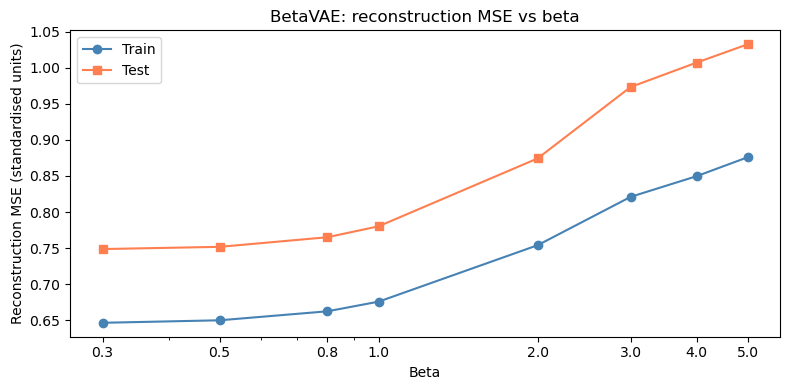

In [3]:
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(BETAS, train_mses, "o-", label="Train", color="steelblue")
ax.plot(BETAS, test_mses,  "s-", label="Test",  color="coral")
ax.set_xlabel("Beta")
ax.set_ylabel("Reconstruction MSE (standardised units)")
ax.set_title("BetaVAE: reconstruction MSE vs beta")
ax.set_xscale("log")
ax.set_xticks(BETAS)
ax.get_xaxis().set_major_formatter(plt.ScalarFormatter())
ax.legend()
fig.tight_layout()
plt.show()

## 2. Generalisation Gap vs Beta

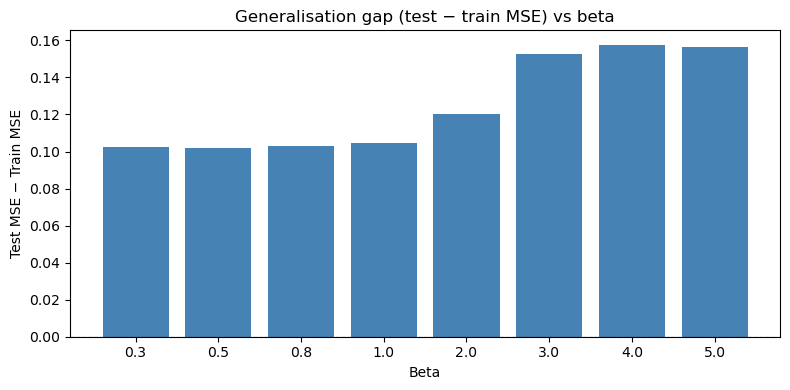

In [4]:
gaps = [t - r for r, t in zip(train_mses, test_mses)]
colors = ["steelblue" if g >= 0 else "crimson" for g in gaps]

fig, ax = plt.subplots(figsize=(8, 4))
ax.bar([str(b) for b in BETAS], gaps, color=colors)
ax.axhline(0, color="k", lw=0.8, ls="--")
ax.set_xlabel("Beta")
ax.set_ylabel("Test MSE − Train MSE")
ax.set_title("Generalisation gap (test − train MSE) vs beta")
fig.tight_layout()
plt.show()

## 3. Per-Commodity MSE Heatmap

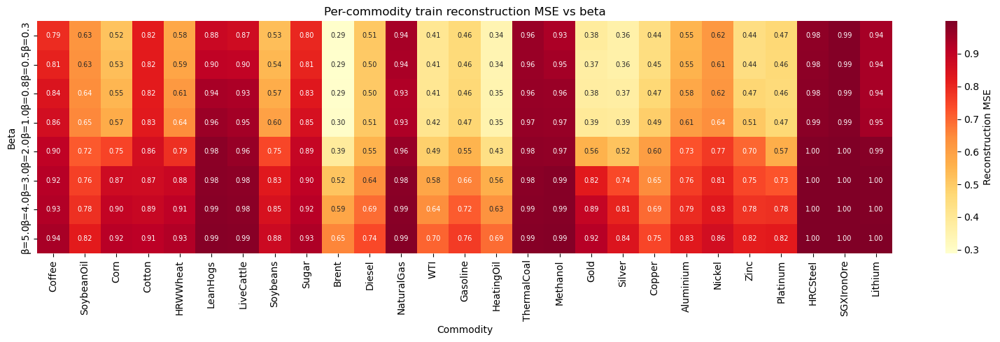

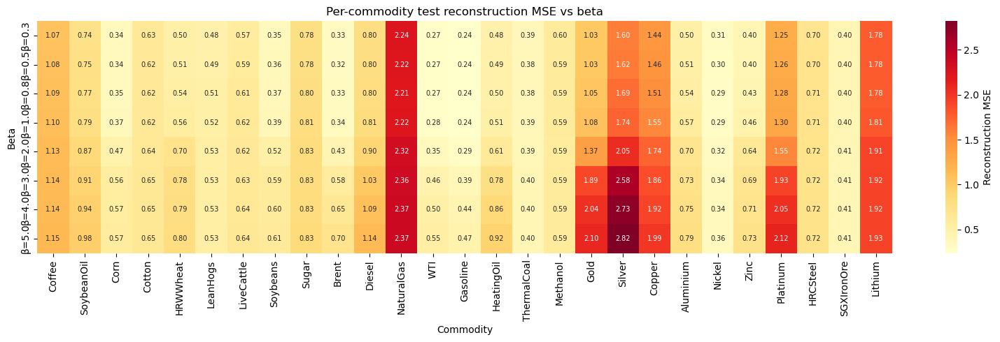

In [5]:
beta_labels = [f"β={b}" for b in BETAS]

for split, tbl in (("train", train_mse_tbl), ("test", test_mse_tbl)):
    data = tbl.drop(columns="ALL").rename(index=dict(zip(BETA_ARCHS, beta_labels)))
    fig, ax = plt.subplots(figsize=(16, 5))
    sns.heatmap(
        data, cmap="YlOrRd", annot=True, fmt=".2f",
        annot_kws={"size": 7}, cbar_kws={"label": "Reconstruction MSE"}, ax=ax,
    )
    ax.set_title(f"Per-commodity {split} reconstruction MSE vs beta")
    ax.set_xlabel("Commodity")
    ax.set_ylabel("Beta")
    fig.tight_layout()
    plt.show()

## 4. Factor Variances vs Beta

Low variance on a factor means the encoder has collapsed that dimension toward zero — the KL penalty at high beta forces the latent code toward the prior, killing information.

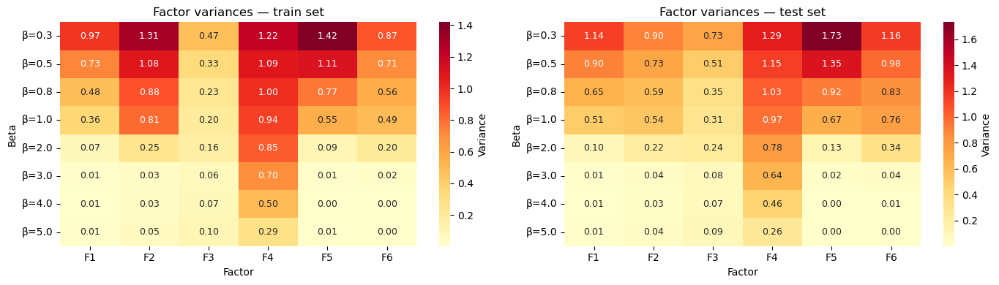

In [6]:
def load_factor_var(arch, split):
    return pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True).var()

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
for ax, split in zip(axes, ("train", "test")):
    var_matrix = pd.DataFrame(
        {f"β={b}": load_factor_var(a, split) for a, b in zip(BETA_ARCHS, BETAS)}
    ).T
    sns.heatmap(
        var_matrix, cmap="YlOrRd", annot=True, fmt=".2f",
        annot_kws={"size": 9}, ax=ax, cbar_kws={"label": "Variance"},
    )
    ax.set_title(f"Factor variances — {split} set")
    ax.set_xlabel("Factor")
    ax.set_ylabel("Beta")
fig.tight_layout()
plt.show()

## 5. Active Factor Count vs Beta

A factor is "active" if its variance exceeds a threshold (0.1). Shows how many dimensions the encoder uses at each beta.

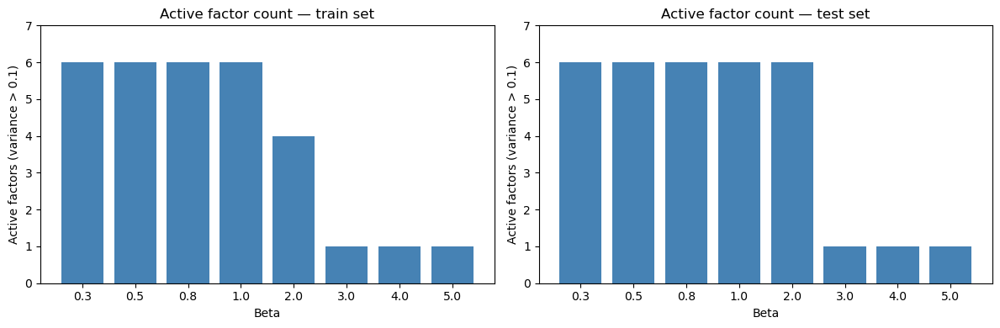

In [7]:
THRESHOLD = 0.1

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for ax, split in zip(axes, ("train", "test")):
    active_counts = [
        int((load_factor_var(a, split) > THRESHOLD).sum())
        for a in BETA_ARCHS
    ]
    ax.bar([str(b) for b in BETAS], active_counts, color="steelblue")
    ax.set_ylim(0, max(active_counts) + 1)
    ax.set_xlabel("Beta")
    ax.set_ylabel(f"Active factors (variance > {THRESHOLD})")
    ax.set_title(f"Active factor count — {split} set")
fig.tight_layout()
plt.show()

## 6. Factor Time Series

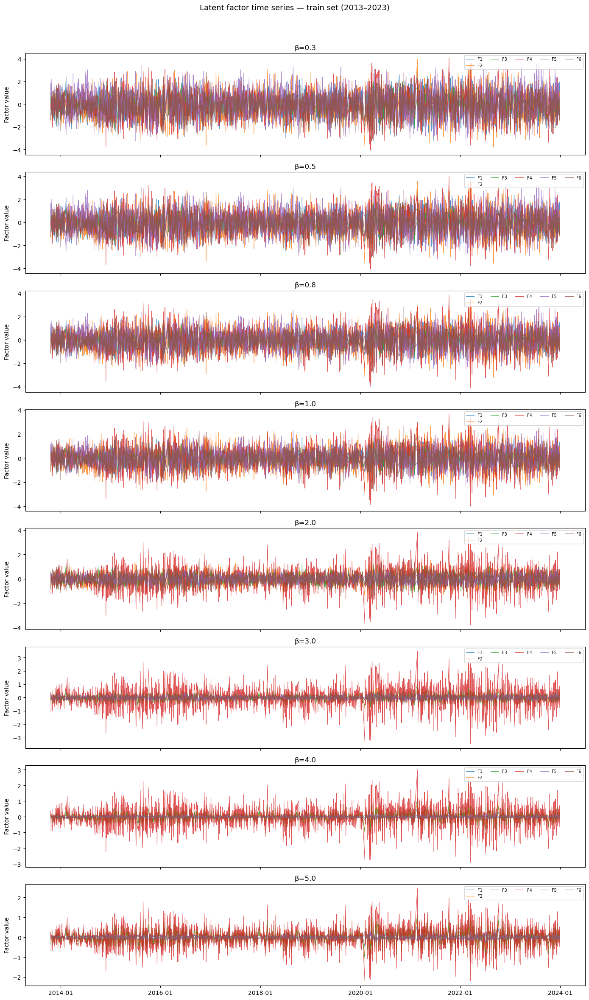

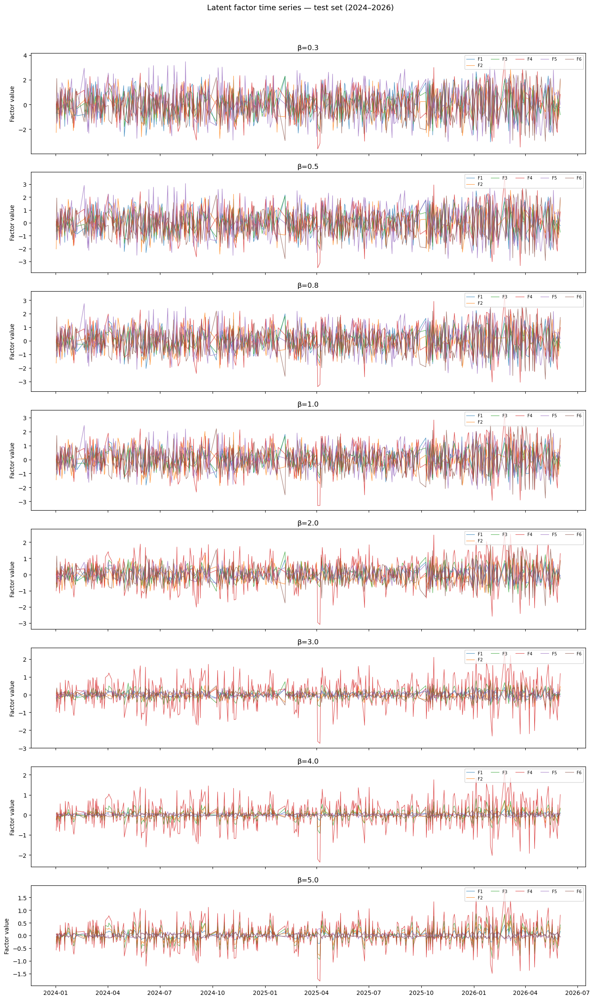

In [8]:
for split in ("train", "test"):
    n = len(BETA_ARCHS)
    fig, axes = plt.subplots(n, 1, figsize=(14, 3 * n), sharex=True)
    if n == 1:
        axes = [axes]
    for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
        factors = pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True)
        for col in factors.columns:
            ax.plot(factors.index, factors[col], lw=0.8, alpha=0.8, label=col)
        ax.set_title(f"β={beta}")
        ax.set_ylabel("Factor value")
        ax.legend(loc="upper right", fontsize=7, ncol=5)
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
    year_range = "2013–2023" if split == "train" else "2024–2026"
    fig.suptitle(f"Latent factor time series — {split} set ({year_range})", fontsize=13)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

## 7. R² Explained per Beta

R² = 1 − MSE (valid because input is z-scored, so baseline variance = 1 per commodity).  
RMSE = √MSE.  
Higher β → stronger KL penalty → factors compressed toward prior → reconstruction worsens → lower R².

In [9]:
_SECTOR_MAP = {
    "Brent":"Energy","WTI":"Energy","NaturalGas":"Energy","Gasoline":"Energy",
    "Diesel":"Energy","HeatingOil":"Energy","ThermalCoal":"Energy","Methanol":"Energy",
    "Gold":"Metals","Silver":"Metals","Copper":"Metals","Aluminium":"Metals",
    "Nickel":"Metals","Zinc":"Metals","Platinum":"Metals","HRCSteel":"Metals",
    "SGXIronOre":"Metals","Lithium":"Metals",
    "Coffee":"Agriculture","Corn":"Agriculture","Cotton":"Agriculture",
    "LeanHogs":"Agriculture","LiveCattle":"Agriculture","Sugar":"Agriculture",
    "Soybeans":"Agriculture","SoybeanOil":"Agriculture","HRWWheat":"Agriculture",
}
_SECTOR_ORDER = ["Energy", "Metals", "Agriculture"]
beta_labels   = [f"β={b}" for b in BETAS]

def _metrics_df(mse_tbl):
    rows = []
    for arch in BETA_ARCHS:
        for com in mse_tbl.drop(columns="ALL").columns:
            mse = mse_tbl.loc[arch, com]
            rows.append({
                "beta_arch": arch,
                "commodity": com,
                "sector":    _SECTOR_MAP.get(com, "?"),
                "MSE":       mse,
                "RMSE":      np.sqrt(mse),
                "R2":        1.0 - mse,
            })
    return pd.DataFrame(rows)

train_metrics = _metrics_df(train_mse_tbl)
test_metrics  = _metrics_df(test_mse_tbl)

for label, df in [("Train (2013–2023)", train_metrics), ("Test (2024–2026)", test_metrics)]:
    print(f"\n{'═'*60}")
    print(f"  {label}")
    print(f"{'═'*60}")

    overall = df.groupby("beta_arch")[["MSE","RMSE","R2"]].mean().loc[BETA_ARCHS]
    overall.index = beta_labels
    print("\n— Overall —")
    display(overall.round(4))

    sector_tbl = (
        df.groupby(["beta_arch","sector"])[["MSE","RMSE","R2"]]
        .mean()
        .unstack("sector")
        .loc[BETA_ARCHS]
        .reindex(columns=pd.MultiIndex.from_product([["MSE","RMSE","R2"], _SECTOR_ORDER]))
    )
    sector_tbl.index = beta_labels
    print("\n— Per sector —")
    display(sector_tbl.round(4))


════════════════════════════════════════════════════════════
  Train (2013–2023)
════════════════════════════════════════════════════════════

— Overall —


,MSE,RMSE,R2
β=0.3,0.6463,0.7910,0.3537
β=0.5,0.6498,0.7929,0.3502
β=0.8,0.6623,0.8007,0.3377
β=1.0,0.6757,0.8095,0.3243
β=2.0,0.7539,0.8606,0.2461
β=3.0,0.8210,0.9022,0.1790
β=4.0,0.8497,0.9191,0.1503
β=5.0,0.8760,0.9342,0.1240



— Per sector —


MSE                        RMSE                          R2          \
       Energy  Metals Agriculture  Energy  Metals Agriculture  Energy  Metals   
β=0.3  0.6065  0.6179      0.7131  0.7595  0.7719      0.8403  0.3935  0.3821   
β=0.5  0.6056  0.6170      0.7254  0.7586  0.7711      0.8475  0.3944  0.3830   
β=0.8  0.6090  0.6268      0.7490  0.7609  0.7782      0.8611  0.3910  0.3732   
β=1.0  0.6139  0.6423      0.7676  0.7645  0.7891      0.8722  0.3861  0.3577   
β=2.0  0.6660  0.7425      0.8448  0.8029  0.8554      0.9177  0.3340  0.2575   
β=3.0  0.7397  0.8249      0.8888  0.8528  0.9058      0.9421  0.2603  0.1751   
β=4.0  0.7782  0.8576      0.9044  0.8772  0.9244      0.9505  0.2218  0.1424   
β=5.0  0.8154  0.8837      0.9215  0.8997  0.9389      0.9596  0.1846  0.1163   

                   
      Agriculture  
β=0.3      0.2869  
β=0.5      0.2746  
β=0.8      0.2510  
β=1.0      0.2324  
β=2.0      0.1552  
β=3.0      0.1112  
β=4.0      0.0956  
β=5.0      0.0785


════════════════════════════════════════════════════════════
  Test (2024–2026)
════════════════════════════════════════════════════════════

— Overall —


,MSE,RMSE,R2
β=0.3,0.7486,0.8243,0.2514
β=0.5,0.7517,0.8261,0.2483
β=0.8,0.7650,0.8337,0.2350
β=1.0,0.7802,0.8423,0.2198
β=2.0,0.8743,0.8941,0.1257
β=3.0,0.9734,0.9421,0.0266
β=4.0,1.0072,0.9579,-0.0072
β=5.0,1.0327,0.9701,-0.0327



— Per sector —


MSE                        RMSE                          R2          \
       Energy  Metals Agriculture  Energy  Metals Agriculture  Energy  Metals   
β=0.3  0.6663  0.9424      0.6063  0.7565  0.9304      0.7667  0.3337  0.0576   
β=0.5  0.6638  0.9457      0.6141  0.7555  0.9316      0.7718  0.3362  0.0543   
β=0.8  0.6654  0.9672      0.6289  0.7574  0.9418      0.7816  0.3346  0.0328   
β=1.0  0.6715  0.9916      0.6419  0.7612  0.9538      0.7903  0.3285  0.0084   
β=2.0  0.7357  1.1410      0.7013  0.8047  1.0236      0.8296  0.2643 -0.1410   
β=3.0  0.8229  1.3069      0.7365  0.8619  1.0876      0.8517  0.1771 -0.3069   
β=4.0  0.8633  1.3597      0.7436  0.8865  1.1069      0.8557  0.1367 -0.3597   
β=5.0  0.8937  1.3964      0.7521  0.9045  1.1212      0.8604  0.1063 -0.3964   

                   
      Agriculture  
β=0.3      0.3937  
β=0.5      0.3859  
β=0.8      0.3711  
β=1.0      0.3581  
β=2.0      0.2987  
β=3.0      0.2635  
β=4.0      0.2564  
β=5.0      0.2479

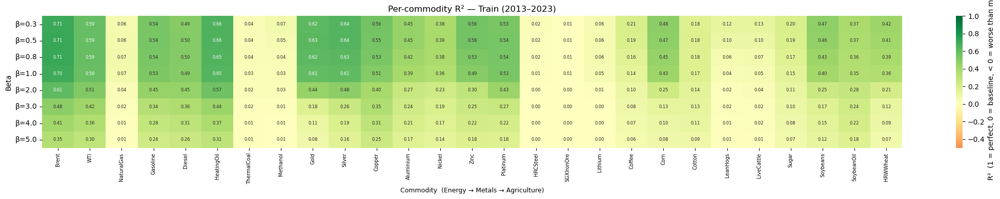

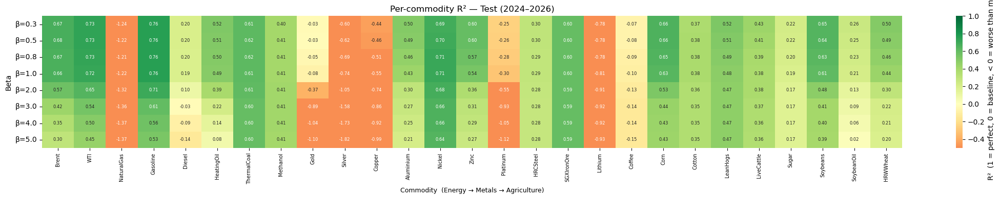

In [10]:
_COMMODITIES_ORDERED = sorted(
    _SECTOR_MAP,
    key=lambda c: (_SECTOR_ORDER.index(_SECTOR_MAP[c]), list(_SECTOR_MAP).index(c)),
)

for label, metrics in [("Train (2013–2023)", train_metrics), ("Test (2024–2026)", test_metrics)]:
    r2_wide = (
        metrics.pivot(index="beta_arch", columns="commodity", values="R2")
        .loc[BETA_ARCHS, _COMMODITIES_ORDERED]
    )
    r2_wide.index = beta_labels
    fig, ax = plt.subplots(figsize=(22, 4))
    sns.heatmap(
        r2_wide,
        cmap="RdYlGn", center=0, vmin=-0.5, vmax=1.0,
        annot=True, fmt=".2f", annot_kws={"size": 6},
        cbar_kws={"label": "R²  (1 = perfect, 0 = baseline, < 0 = worse than mean)"},
        ax=ax,
    )
    ax.set_title(f"Per-commodity R² — {label}", fontsize=12)
    ax.set_xlabel("Commodity  (Energy → Metals → Agriculture)", fontsize=9)
    ax.set_ylabel("Beta")
    ax.tick_params(axis="x", rotation=90, labelsize=7)
    fig.tight_layout()
    plt.show()

## 8. Factor Correlation Heatmaps

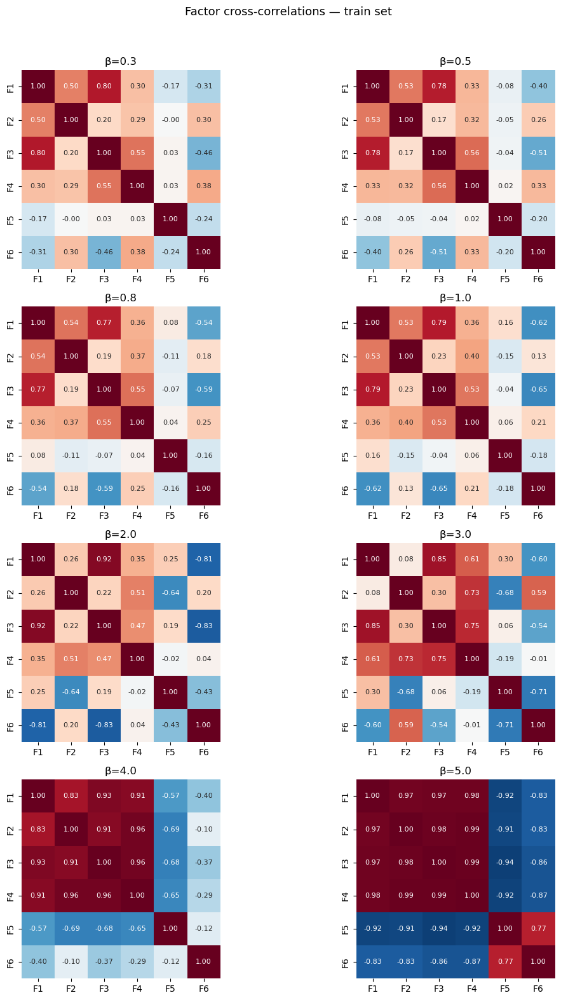

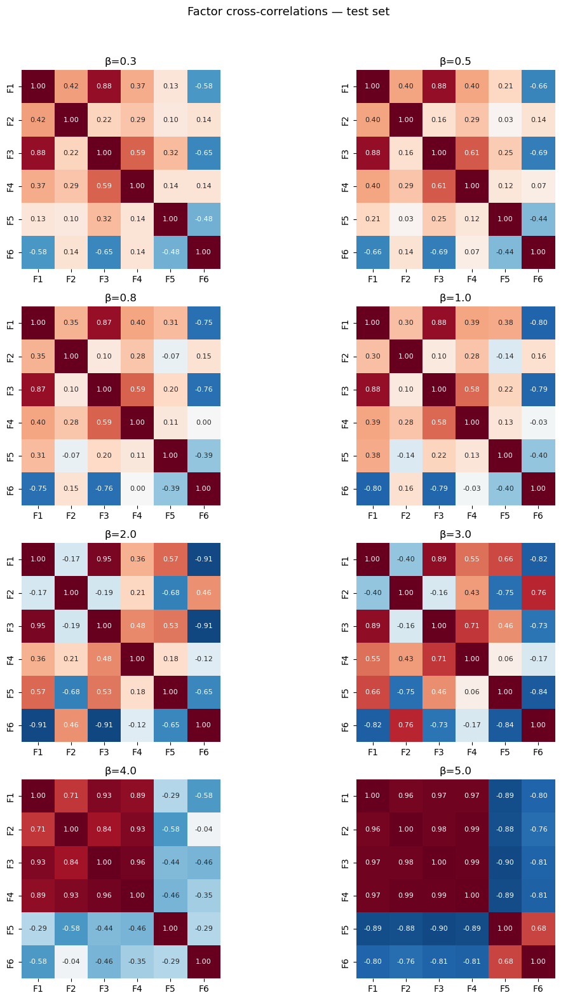

In [11]:
n = len(BETA_ARCHS)
ncols = 2
nrows = (n + 1) // ncols

for split in ("train", "test"):
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 4 * nrows))
    axes = axes.flatten()
    for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
        factors = pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True)
        sns.heatmap(
            factors.corr(), ax=ax, cmap="RdBu_r", center=0, vmin=-1, vmax=1,
            annot=True, fmt=".2f", annot_kws={"size": 8}, square=True, cbar=False,
        )
        ax.set_title(f"β={beta}")
    for ax in axes[n:]:
        ax.set_visible(False)
    fig.suptitle(f"Factor cross-correlations — {split} set", fontsize=13)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

## 9. Latent Factor Interpretation

For each beta value, we compute the **correlation between each latent factor and each commodity return** — the autoencoder equivalent of PCA loadings. Higher β values are expected to produce more disentangled but less commodity-specific factors as the KL penalty pushes the posterior toward a structureless prior.

In [12]:
returns_raw = pd.read_csv("../data/returns.csv", index_col=0, parse_dates=True)

SECTOR_MAP = {
    "Brent":"Energy","WTI":"Energy","NaturalGas":"Energy","Gasoline":"Energy",
    "Diesel":"Energy","HeatingOil":"Energy","ThermalCoal":"Energy","Methanol":"Energy",
    "Gold":"Metals","Silver":"Metals","Copper":"Metals","Aluminium":"Metals",
    "Nickel":"Metals","Zinc":"Metals","Platinum":"Metals","HRCSteel":"Metals",
    "SGXIronOre":"Metals","Lithium":"Metals",
    "Coffee":"Agriculture","Corn":"Agriculture","Cotton":"Agriculture",
    "LeanHogs":"Agriculture","LiveCattle":"Agriculture","Sugar":"Agriculture",
    "Soybeans":"Agriculture","SoybeanOil":"Agriculture","HRWWheat":"Agriculture",
}
SECTOR_ORDER = ["Energy", "Metals", "Agriculture"]
COMMODITIES_ORDERED = sorted(
    SECTOR_MAP, key=lambda c: (SECTOR_ORDER.index(SECTOR_MAP[c]), list(SECTOR_MAP).index(c))
)

def factor_commodity_corr(arch, split):
    factors = pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True)
    rets    = returns_raw.reindex(factors.index)[COMMODITIES_ORDERED]
    return pd.DataFrame(
        {col: factors.corrwith(rets[col]) for col in rets.columns},
        index=factors.columns,
    )

### 9a. Factor–commodity correlation heatmaps (train then test)

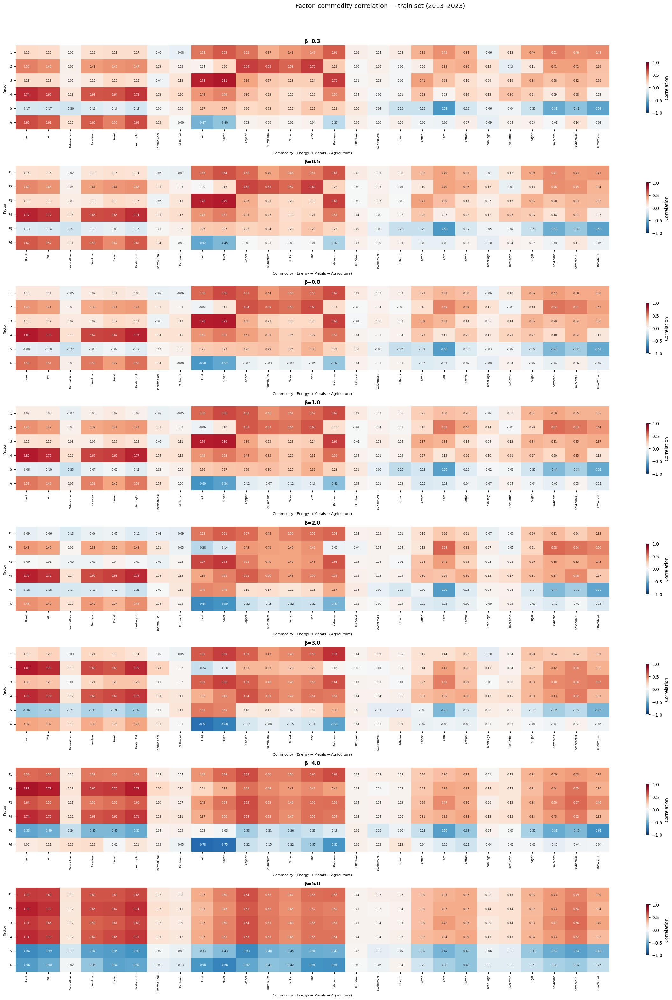

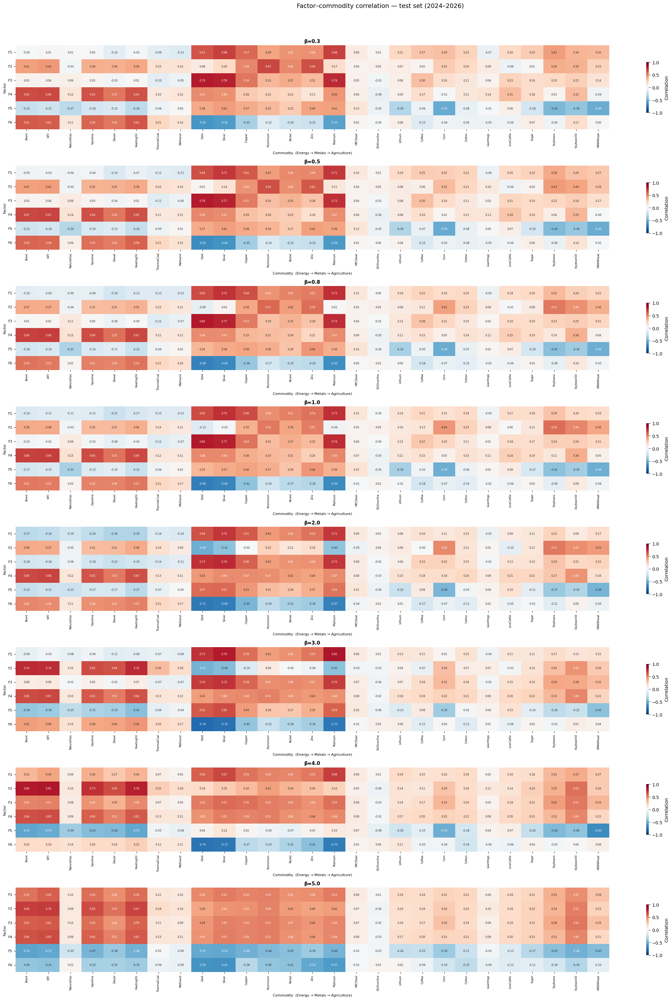

In [13]:
for split in ("train", "test"):
    nb = len(BETA_ARCHS)
    fig, axes = plt.subplots(nb, 1, figsize=(24, 4 * nb))
    if nb == 1:
        axes = [axes]
    for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
        corr = factor_commodity_corr(arch, split)
        sns.heatmap(
            corr, ax=ax, cmap="RdBu_r", center=0, vmin=-1, vmax=1,
            annot=True, fmt=".2f", annot_kws={"size": 6},
            xticklabels=corr.columns, yticklabels=corr.index, cbar=True,
            cbar_kws={"label": "Correlation", "shrink": 0.6},
        )
        ax.set_title(f"β={beta}", fontsize=11, fontweight="bold")
        ax.set_xlabel("Commodity  (Energy → Metals → Agriculture)", fontsize=8)
        ax.set_ylabel("Factor", fontsize=8)
        ax.tick_params(axis="x", rotation=90, labelsize=6)
        ax.tick_params(axis="y", rotation=0,  labelsize=8)
    year = "2013–2023" if split == "train" else "2024–2026"
    fig.suptitle(f"Factor–commodity correlation — {split} set ({year})", fontsize=14)
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

### 9b. Top commodities per factor (train, by absolute correlation)

In [14]:
TOP_N = 5
for arch, beta in zip(BETA_ARCHS, BETAS):
    corr = factor_commodity_corr(arch, "train")
    rows = []
    for factor in corr.index:
        top = corr.loc[factor].abs().nlargest(TOP_N)
        for rank, (com, _) in enumerate(top.items(), 1):
            rows.append({
                "factor":      factor,
                "rank":        rank,
                "commodity":   com,
                "sector":      SECTOR_MAP[com],
                "correlation": round(corr.loc[factor, com], 3),
            })
    tbl = pd.DataFrame(rows).set_index(["factor", "rank"])
    print(f"\n{'─' * 60}")
    print(f"  β={beta} — top {TOP_N} commodities per factor (train, |corr|)")
    print(f"{'─' * 60}")
    display(tbl)


────────────────────────────────────────────────────────────
  β=0.3 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1         Silver       Metals        0.615
       2       Platinum       Metals        0.608
       3         Copper       Metals        0.546
       4           Gold       Metals        0.537
       5       Soybeans  Agriculture        0.513
F2     1           Zinc       Metals        0.702
       2         Copper       Metals        0.694
       3      Aluminium       Metals        0.652
       4         Nickel       Metals        0.581
       5          Brent       Energy        0.500
F3     1         Silver       Metals        0.805
       2           Gold       Metals        0.780
       3       Platinum       Metals        0.698
       4         Coffee  Agriculture        0.413
       5         Copper       Metals        0.393
F4     1          Brent       Energy        0.743
       2     HeatingOil       Energy        0.718
       3            WTI       Energy        0.693
       4         Diesel       Energy        0.639
       5       Gasoline       Energy        0.630
F5     1           Corn  Agriculture       -0.581
       2       HRWWheat  Agriculture       -0.534
       3       Soybeans  Agriculture       -0.513
       4     SoybeanOil  Agriculture       -0.408
       5           Gold       Metals        0.273
F6     1          Brent       Energy        0.655
       2     HeatingOil       Energy        0.651
       3            WTI       Energy        0.608
       4       Gasoline       Energy        0.604
       5         Diesel       Energy        0.505


────────────────────────────────────────────────────────────
  β=0.5 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1         Silver       Metals        0.637
       2       Platinum       Metals        0.631
       3         Copper       Metals        0.575
       4           Gold       Metals        0.556
       5           Zinc       Metals        0.509
F2     1           Zinc       Metals        0.690
       2         Copper       Metals        0.679
       3      Aluminium       Metals        0.634
       4         Nickel       Metals        0.575
       5          Brent       Energy        0.487
F3     1         Silver       Metals        0.795
       2           Gold       Metals        0.778
       3       Platinum       Metals        0.683
       4         Coffee  Agriculture        0.412
       5         Copper       Metals        0.361
F4     1          Brent       Energy        0.769
       2     HeatingOil       Energy        0.740
       3            WTI       Energy        0.719
       4         Diesel       Energy        0.659
       5       Gasoline       Energy        0.651
F5     1           Corn  Agriculture       -0.577
       2       HRWWheat  Agriculture       -0.532
       3       Soybeans  Agriculture       -0.497
       4     SoybeanOil  Agriculture       -0.387
       5           Zinc       Metals        0.289
F6     1          Brent       Energy        0.619
       2     HeatingOil       Energy        0.615
       3       Gasoline       Energy        0.576
       4            WTI       Energy        0.573
       5           Gold       Metals       -0.517


────────────────────────────────────────────────────────────
  β=0.8 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1         Silver       Metals        0.659
       2       Platinum       Metals        0.649
       3         Copper       Metals        0.608
       4           Gold       Metals        0.577
       5           Zinc       Metals        0.548
F2     1           Zinc       Metals        0.652
       2         Copper       Metals        0.640
       3      Aluminium       Metals        0.590
       4         Nickel       Metals        0.554
       5       Soybeans  Agriculture        0.542
F3     1         Silver       Metals        0.793
       2           Gold       Metals        0.782
       3       Platinum       Metals        0.682
       4         Coffee  Agriculture        0.389
       5       HRWWheat  Agriculture        0.361
F4     1          Brent       Energy        0.798
       2     HeatingOil       Energy        0.766
       3            WTI       Energy        0.747
       4         Diesel       Energy        0.685
       5       Gasoline       Energy        0.674
F5     1           Corn  Agriculture       -0.556
       2       HRWWheat  Agriculture       -0.512
       3       Soybeans  Agriculture       -0.453
       4     SoybeanOil  Agriculture       -0.346
       5           Zinc       Metals        0.345
F6     1           Gold       Metals       -0.582
       2          Brent       Energy        0.556
       3     HeatingOil       Energy        0.554
       4       Gasoline       Energy        0.528
       5         Silver       Metals       -0.519


────────────────────────────────────────────────────────────
  β=1.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1         Silver       Metals        0.663
       2       Platinum       Metals        0.650
       3         Copper       Metals        0.622
       4           Gold       Metals        0.577
       5           Zinc       Metals        0.572
F2     1           Zinc       Metals        0.628
       2         Copper       Metals        0.620
       3       Soybeans  Agriculture        0.568
       4      Aluminium       Metals        0.566
       5         Nickel       Metals        0.541
F3     1         Silver       Metals        0.800
       2           Gold       Metals        0.786
       3       Platinum       Metals        0.691
       4         Copper       Metals        0.389
       5       HRWWheat  Agriculture        0.371
F4     1          Brent       Energy        0.799
       2     HeatingOil       Energy        0.767
       3            WTI       Energy        0.748
       4         Diesel       Energy        0.689
       5       Gasoline       Energy        0.674
F5     1           Corn  Agriculture       -0.554
       2       HRWWheat  Agriculture       -0.510
       3       Soybeans  Agriculture       -0.439
       4           Zinc       Metals        0.355
       5     SoybeanOil  Agriculture       -0.335
F6     1           Gold       Metals       -0.600
       2         Silver       Metals       -0.544
       3          Brent       Energy        0.532
       4     HeatingOil       Energy        0.531
       5       Gasoline       Energy        0.507


────────────────────────────────────────────────────────────
  β=2.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1         Silver       Metals        0.606
       2       Platinum       Metals        0.578
       3         Copper       Metals        0.567
       4           Zinc       Metals        0.554
       5           Gold       Metals        0.534
F2     1           Corn  Agriculture        0.582
       2       Soybeans  Agriculture        0.576
       3     SoybeanOil  Agriculture        0.540
       4       HRWWheat  Agriculture        0.497
       5           Zinc       Metals        0.449
F3     1         Silver       Metals        0.717
       2           Gold       Metals        0.672
       3       Platinum       Metals        0.629
       4         Copper       Metals        0.514
       5           Zinc       Metals        0.432
F4     1          Brent       Energy        0.775
       2     HeatingOil       Energy        0.744
       3            WTI       Energy        0.724
       4         Diesel       Energy        0.682
       5       Gasoline       Energy        0.653
F5     1           Corn  Agriculture       -0.559
       2       HRWWheat  Agriculture       -0.525
       3           Gold       Metals        0.489
       4         Silver       Metals        0.464
       5       Soybeans  Agriculture       -0.444
F6     1           Gold       Metals       -0.638
       2         Silver       Metals       -0.594
       3       Platinum       Metals       -0.472
       4     HeatingOil       Energy        0.461
       5          Brent       Energy        0.458


────────────────────────────────────────────────────────────
  β=3.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1       Platinum       Metals        0.734
       2         Silver       Metals        0.693
       3           Gold       Metals        0.614
       4         Copper       Metals        0.597
       5           Zinc       Metals        0.585
F2     1          Brent       Energy        0.795
       2            WTI       Energy        0.753
       3     HeatingOil       Energy        0.748
       4       Gasoline       Energy        0.659
       5         Diesel       Energy        0.629
F3     1         Silver       Metals        0.680
       2       Platinum       Metals        0.642
       3           Gold       Metals        0.599
       4         Copper       Metals        0.598
       5       HRWWheat  Agriculture        0.520
F4     1          Brent       Energy        0.749
       2     HeatingOil       Energy        0.717
       3            WTI       Energy        0.701
       4         Diesel       Energy        0.659
       5         Copper       Metals        0.640
F5     1           Gold       Metals        0.527
       2         Silver       Metals        0.493
       3       HRWWheat  Agriculture       -0.457
       4           Corn  Agriculture       -0.446
       5     HeatingOil       Energy       -0.369
F6     1           Gold       Metals       -0.744
       2         Silver       Metals       -0.681
       3       Platinum       Metals       -0.533
       4     HeatingOil       Energy        0.395
       5          Brent       Energy        0.391


────────────────────────────────────────────────────────────
  β=4.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity       sector  correlation
factor rank                                      
F1     1       Platinum       Metals        0.654
       2         Copper       Metals        0.652
       3           Zinc       Metals        0.596
       4            WTI       Energy        0.585
       5         Silver       Metals        0.576
F2     1          Brent       Energy        0.827
       2     HeatingOil       Energy        0.782
       3            WTI       Energy        0.782
       4         Diesel       Energy        0.704
       5       Gasoline       Energy        0.692
F3     1         Copper       Metals        0.655
       2          Brent       Energy        0.635
       3     HeatingOil       Energy        0.604
       4            WTI       Energy        0.593
       5     SoybeanOil  Agriculture        0.571
F4     1          Brent       Energy        0.744
       2     HeatingOil       Energy        0.713
       3            WTI       Energy        0.698
       4         Diesel       Energy        0.656
       5         Copper       Metals        0.644
F5     1       HRWWheat  Agriculture       -0.606
       2           Corn  Agriculture       -0.553
       3          Brent       Energy       -0.527
       4       Soybeans  Agriculture       -0.506
       5     HeatingOil       Energy       -0.502
F6     1           Gold       Metals       -0.775
       2         Silver       Metals       -0.755
       3       Platinum       Metals       -0.589
       4           Zinc       Metals       -0.346
       5         Copper       Metals       -0.225


────────────────────────────────────────────────────────────
  β=5.0 — top 5 commodities per factor (train, |corr|)
────────────────────────────────────────────────────────────


commodity  sector  correlation
factor rank                                 
F1     1          Brent  Energy        0.696
       2            WTI  Energy        0.691
       3     HeatingOil  Energy        0.666
       4         Copper  Metals        0.644
       5         Diesel  Energy        0.630
F2     1          Brent  Energy        0.778
       2     HeatingOil  Energy        0.740
       3            WTI  Energy        0.733
       4         Diesel  Energy        0.672
       5       Gasoline  Energy        0.661
F3     1          Brent  Energy        0.709
       2     HeatingOil  Energy        0.679
       3            WTI  Energy        0.659
       4         Copper  Metals        0.643
       5         Diesel  Energy        0.613
F4     1          Brent  Energy        0.745
       2     HeatingOil  Energy        0.712
       3            WTI  Energy        0.698
       4         Diesel  Energy        0.657
       5         Copper  Metals        0.645
F5     1          Brent  Energy       -0.639
       2         Copper  Metals       -0.633
       3     HeatingOil  Energy       -0.594
       4            WTI  Energy       -0.587
       5         Diesel  Energy       -0.555
F6     1         Silver  Metals       -0.665
       2       Platinum  Metals       -0.609
       3           Zinc  Metals       -0.596
       4           Gold  Metals       -0.584
       5          Brent  Energy       -0.558

### 9c. Factor–sector alignment (mean |correlation| per sector)

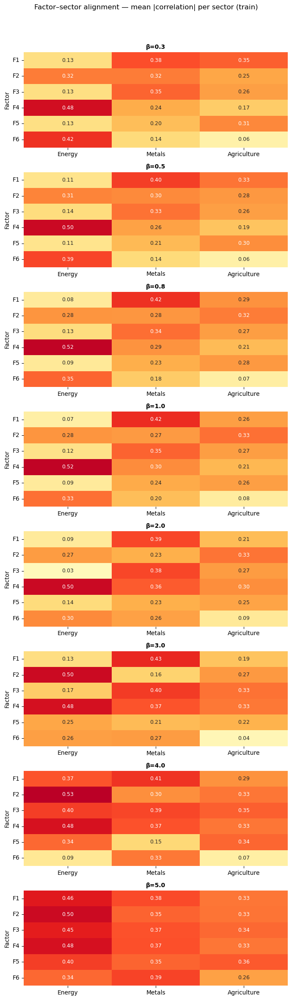

In [15]:
nb = len(BETA_ARCHS)
fig, axes = plt.subplots(nb, 1, figsize=(7, 3 * nb))
if nb == 1:
    axes = [axes]

for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
    corr = factor_commodity_corr(arch, "train")
    alignment = pd.DataFrame({
        sector: corr[[c for c in COMMODITIES_ORDERED if SECTOR_MAP[c] == sector]].abs().mean(axis=1)
        for sector in SECTOR_ORDER
    })
    sns.heatmap(
        alignment, ax=ax, cmap="YlOrRd", vmin=0, vmax=0.6,
        annot=True, fmt=".2f", annot_kws={"size": 9}, cbar=False,
    )
    ax.set_title(f"β={beta}", fontsize=10, fontweight="bold")
    ax.set_ylabel("Factor")
    ax.tick_params(axis="y", rotation=0)

fig.suptitle("Factor–sector alignment — mean |correlation| per sector (train)", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 9d. Cross-beta factor agreement

Do different beta values discover the same 5 factors? Hungarian-algorithm matching on the 5×5 absolute-correlation matrix between any two beta's factor matrices. Score near 1 = same factors found; near 0 = completely different representations.

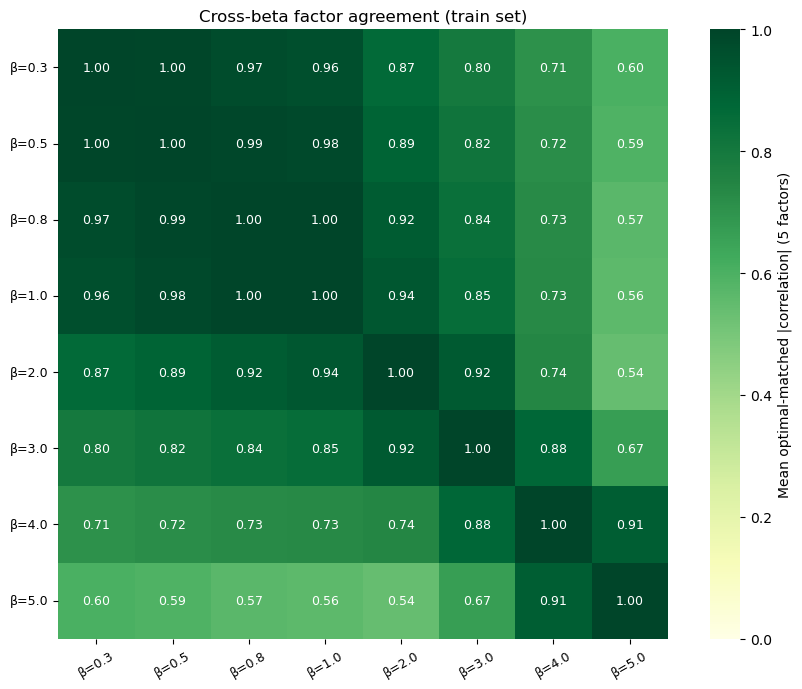

In [16]:
from scipy.optimize import linear_sum_assignment

def _factor_agreement(arch_a, arch_b, split="train"):
    fa = pd.read_csv(FACTORS / f"{arch_a}_{split}_factors.csv", index_col=0, parse_dates=True)
    fb = pd.read_csv(FACTORS / f"{arch_b}_{split}_factors.csv", index_col=0, parse_dates=True)
    common = fa.index.intersection(fb.index)
    fa, fb = fa.loc[common].to_numpy(), fb.loc[common].to_numpy()
    K = fa.shape[1]
    cost = np.array(
        [[abs(float(np.corrcoef(fa[:, i], fb[:, j])[0, 1])) for j in range(K)] for i in range(K)]
    )
    row, col = linear_sum_assignment(-cost)
    return float(cost[row, col].mean())

agree = pd.DataFrame(
    [[_factor_agreement(a, b) for b in BETA_ARCHS] for a in BETA_ARCHS],
    index=beta_labels, columns=beta_labels,
)

fig, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(
    agree, ax=ax, cmap="YlGn", vmin=0, vmax=1,
    annot=True, fmt=".2f", annot_kws={"size": 9}, square=True,
    cbar_kws={"label": "Mean optimal-matched |correlation| (5 factors)"},
)
ax.set_title("Cross-beta factor agreement (train set)", fontsize=12)
ax.tick_params(axis="x", rotation=30, labelsize=9)
ax.tick_params(axis="y", rotation=0,  labelsize=9)
fig.tight_layout()
plt.show()

### 9e. Factor autocorrelation — temporal persistence

Lag-1 (daily), lag-5 (weekly), lag-21 (monthly) autocorrelation per factor. High autocorrelation → slow macro regime signal. Near zero → fast noise. Watch for autocorrelation collapsing at high β as posterior collapse kills factor dynamics.

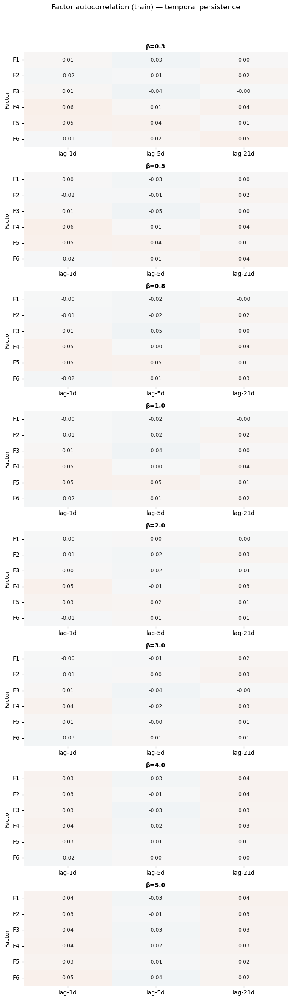

In [17]:
LAGS = [1, 5, 21]

nb = len(BETA_ARCHS)
fig, axes = plt.subplots(nb, 1, figsize=(7, 3 * nb))
if nb == 1:
    axes = [axes]

for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
    factors = pd.read_csv(FACTORS / f"{arch}_train_factors.csv", index_col=0, parse_dates=True)
    acorr = pd.DataFrame(
        {f"lag-{lag}d": factors.apply(lambda col: col.autocorr(lag=lag)) for lag in LAGS}
    )
    sns.heatmap(
        acorr, ax=ax, cmap="RdBu_r", center=0, vmin=-1, vmax=1,
        annot=True, fmt=".2f", annot_kws={"size": 9}, cbar=False,
    )
    ax.set_title(f"β={beta}", fontsize=10, fontweight="bold")
    ax.set_ylabel("Factor")
    ax.tick_params(axis="y", rotation=0)

fig.suptitle("Factor autocorrelation (train) — temporal persistence", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 9f. Rolling factor–commodity correlation (stability)

252-day rolling correlation between each factor and its highest-correlated commodity. Stable lines = factor has a consistent economic interpretation across time. Drifting or flipping lines = the factor mixes signals, especially at high β.

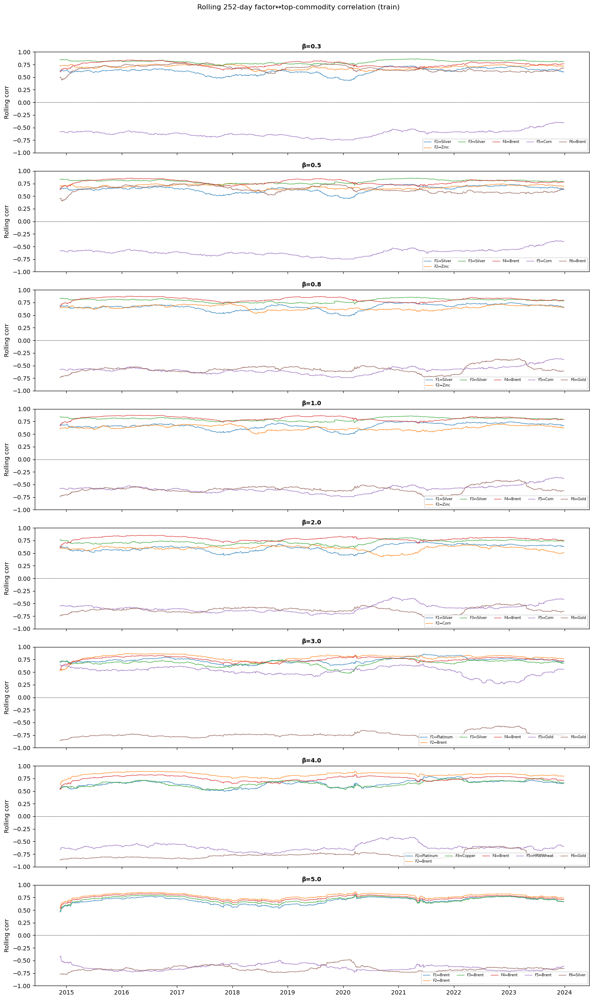

In [18]:
ROLL_WINDOW = 252

nb = len(BETA_ARCHS)
fig, axes = plt.subplots(nb, 1, figsize=(14, 3 * nb), sharex=True)
if nb == 1:
    axes = [axes]

for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
    corr_full = factor_commodity_corr(arch, "train")
    factors   = pd.read_csv(FACTORS / f"{arch}_train_factors.csv", index_col=0, parse_dates=True)
    rets      = returns_raw.reindex(factors.index)
    for factor in corr_full.index:
        top_com = corr_full.loc[factor].abs().idxmax()
        rolling = factors[factor].rolling(ROLL_WINDOW).corr(rets[top_com])
        ax.plot(rolling.index, rolling, lw=0.9, alpha=0.85, label=f"{factor}↔{top_com}")
    ax.axhline(0, color="k", lw=0.5, ls="--")
    ax.set_ylim(-1, 1)
    ax.set_title(f"β={beta}", fontsize=10, fontweight="bold")
    ax.set_ylabel("Rolling corr")
    ax.legend(loc="lower right", fontsize=6, ncol=5)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

fig.suptitle(f"Rolling {ROLL_WINDOW}-day factor↔top-commodity correlation (train)", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### 9g. Factor behaviour around market events

Factor time series with markers at key commodity market events. Compare how event sensitivity changes across beta values — high β models may show muted responses if factors are collapsed toward the prior.

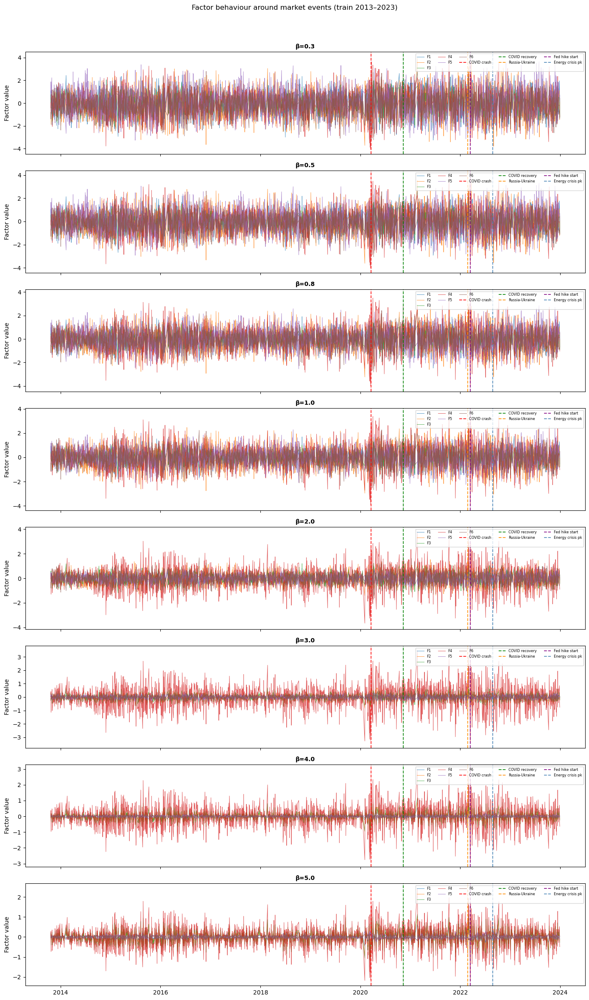

In [19]:
MARKET_EVENTS = {
    "COVID crash":      (pd.Timestamp("2020-03-20"), "red"),
    "COVID recovery":   (pd.Timestamp("2020-11-09"), "green"),
    "Russia-Ukraine":   (pd.Timestamp("2022-02-24"), "darkorange"),
    "Fed hike start":   (pd.Timestamp("2022-03-16"), "purple"),
    "Energy crisis pk": (pd.Timestamp("2022-08-26"), "steelblue"),
}

nb = len(BETA_ARCHS)
fig, axes = plt.subplots(nb, 1, figsize=(14, 3 * nb), sharex=True)
if nb == 1:
    axes = [axes]

for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
    factors = pd.read_csv(FACTORS / f"{arch}_train_factors.csv", index_col=0, parse_dates=True)
    for col in factors.columns:
        ax.plot(factors.index, factors[col], lw=0.7, alpha=0.75, label=col)
    for ev_name, (ev_date, ev_col) in MARKET_EVENTS.items():
        if factors.index.min() <= ev_date <= factors.index.max():
            ax.axvline(ev_date, color=ev_col, lw=1.3, ls="--", alpha=0.9, label=ev_name)
    ax.set_title(f"β={beta}", fontsize=10, fontweight="bold")
    ax.set_ylabel("Factor value")
    ax.legend(loc="upper right", fontsize=6, ncol=5)
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

fig.suptitle("Factor behaviour around market events (train 2013–2023)", fontsize=12)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## 10. Factor ~ Macro Variable Regressions (One-on-One)

For each beta value, we run a simple OLS regression of each latent factor on each macro variable independently:

> `factor_k_t = α + β · macro_var_t + ε_t`

R² measures how much variance in the factor is explained by a single macro variable. `*` marks p < 0.05. Monthly/quarterly series are forward-filled to daily frequency before matching.

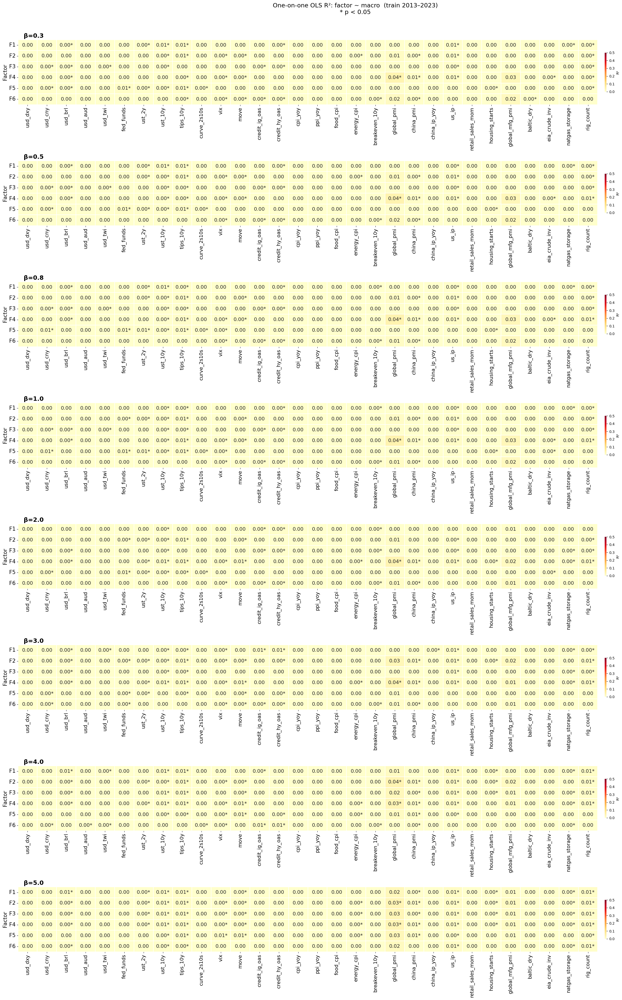

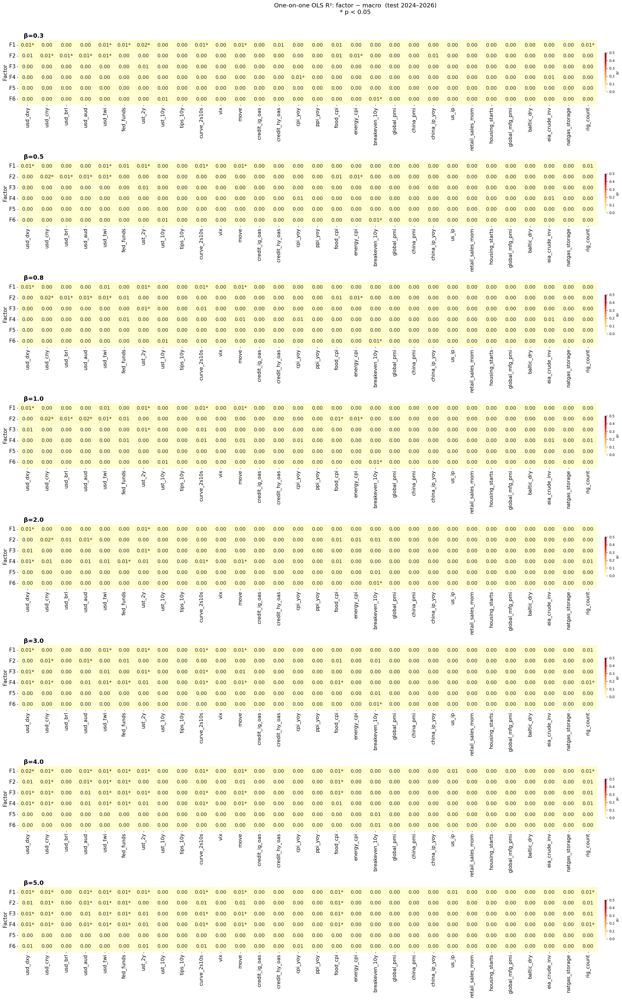


Significant macro predictors per factor  (β=1, train, p < 0.05, ranked by R²)
─────────────────────────────────────────────────────────────────

F1:
  ust_10y                 R²=0.004  p=0.0014*
  us_ip                   R²=0.004  p=0.0032*
  tips_10y                R²=0.003  p=0.0066*
  rig_count               R²=0.003  p=0.0128*
  credit_hy_oas           R²=0.002  p=0.0177*
  natgas_storage          R²=0.002  p=0.0368*
  breakeven_10y           R²=0.002  p=0.0375*

F2:
  tips_10y                R²=0.007  p=0.0001*
  us_ip                   R²=0.006  p=0.0003*
  ust_10y                 R²=0.005  p=0.0010*
  rig_count               R²=0.004  p=0.0022*
  move                    R²=0.003  p=0.0106*
  ust_2y                  R²=0.002  p=0.0235*
  china_pmi               R²=0.002  p=0.0406*
  fed_funds               R²=0.002  p=0.0470*

F3:
  rig_count               R²=0.004  p=0.0012*
  us_ip                   R²=0.004  p=0.0022*
  usd_brl                 R²=0.004  p=0.0040*
  ust_10y   

In [20]:
from scipy.stats import linregress

# Load macro panel and forward-fill monthly/quarterly series to daily
macro_raw = pd.read_csv("../data/macro/macro_panel_raw.csv", index_col=0, parse_dates=True)
macro_ffill = macro_raw.ffill()

# Exclude commodity price series already captured by the VAE
_EXCL = {"wti", "brent", "natgas"}
MACRO_COLS = [c for c in macro_ffill.columns if c not in _EXCL]

def _factor_macro_r2(arch, split):
    """Return (R2, p-value) DataFrame: index=factors, columns=macro vars.
    Regression direction: factor ~ macro_var (macro is X, factor is Y).
    """
    factors = pd.read_csv(FACTORS / f"{arch}_{split}_factors.csv", index_col=0, parse_dates=True)
    common  = factors.index.intersection(macro_ffill.index)
    fac     = factors.loc[common]
    mac     = macro_ffill.loc[common, MACRO_COLS]

    r2_mat = pd.DataFrame(index=fac.columns, columns=MACRO_COLS, dtype=float)
    pv_mat = pd.DataFrame(index=fac.columns, columns=MACRO_COLS, dtype=float)

    for factor in fac.columns:
        for col in MACRO_COLS:
            valid = fac[factor].notna() & mac[col].notna()
            if valid.sum() < 30:
                r2_mat.loc[factor, col] = np.nan
                pv_mat.loc[factor, col] = np.nan
                continue
            # X = macro variable, Y = factor
            _, _, r, p, _ = linregress(mac.loc[valid, col], fac.loc[valid, factor])
            r2_mat.loc[factor, col] = r ** 2
            pv_mat.loc[factor, col] = p

    return r2_mat.astype(float), pv_mat.astype(float)


def _sig_stars(p):
    if np.isnan(p): return ""
    return "*" if p < 0.05 else ""


# ── Plot: one heatmap per beta ─────────────────────────────────────────────
for split in ("train", "test"):
    nb   = len(BETA_ARCHS)
    fig, axes = plt.subplots(nb, 1, figsize=(28, 5 * nb))
    if nb == 1:
        axes = [axes]

    for ax, (arch, beta) in zip(axes, zip(BETA_ARCHS, BETAS)):
        r2, pv = _factor_macro_r2(arch, split)

        annot = r2.copy().astype(object)
        for f in r2.index:
            for col in r2.columns:
                v = r2.loc[f, col]
                s = _sig_stars(pv.loc[f, col])
                annot.loc[f, col] = f"{v:.2f}{s}" if not np.isnan(v) else ""

        sns.heatmap(
            r2, ax=ax,
            cmap="YlOrRd", vmin=0, vmax=0.5,
            annot=annot, fmt="", annot_kws={"size": 14},
            cbar_kws={"label": "R²", "shrink": 0.6, "pad": 0.01},
            linewidths=0.3, linecolor="white",
        )
        ax.set_title(f"β={beta}", fontsize=17, fontweight="bold", loc="left", x=0.01)
        ax.set_ylabel("Factor", fontsize=15)
        ax.tick_params(axis="x", rotation=90, labelsize=14)
        ax.tick_params(axis="y", rotation=0, labelsize=15)

    year = "2013–2023" if split == "train" else "2024–2026"
    fig.suptitle(
        f"One-on-one OLS R²: factor ~ macro  ({split} {year})\n"
        "* p < 0.05",
        fontsize=17,
    )
    fig.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


# ── Table: significant macro predictors per factor (p < 0.05) ─────────────
PREFERRED_BETA = "BetaVAE_b1"
r2_pref, pv_pref = _factor_macro_r2(PREFERRED_BETA, "train")

print(f"\nSignificant macro predictors per factor  (β=1, train, p < 0.05, ranked by R²)\n{'─'*65}")
for factor in r2_pref.index:
    sig = pv_pref.loc[factor].dropna()
    sig = sig[sig < 0.05]
    if sig.empty:
        print(f"\n{factor}:  — none —")
        continue
    ranked = r2_pref.loc[factor, sig.index].sort_values(ascending=False)
    rows = [
        f"  {col:<22}  R²={r2_pref.loc[factor, col]:.3f}  p={pv_pref.loc[factor, col]:.4f}*"
        for col in ranked.index
    ]
    print(f"\n{factor}:")
    print("\n".join(rows))